## Grafos de similaridad (o distancia)

Supongamos que nuestro conjunto de datos está formado por un conjunto de puntos $x_1,...,x_n$. Sobre este conjunto, definimos alguna noción de similaridad (o distancia) $s_{ij}$. Inspirados en la noción de **clustering**, nos proponemos agrupar puntos similares y separar grupos de puntos distintos. Una forma útil de representar esta situación es a través de un **grafo de similaridad (distancia)** $G=(V,E)$, donde el conjunto $V$ representa el conjunto de puntos, y $E$ define distancias entre puntos. Existen diversas opciones para definir $E$:

- **$\epsilon$-graph:** unimos dos puntos $x_i$ y $x_j$ si $s_{ij}<\epsilon$.  
- **$k$-nearest graph:** cada punto $x_i$ se une a los $k$ puntos más cercanos. 
- **complete graph:** cada par de puntos $x_i$ y $x_j$ se une con una arista con un peso igual a $s_{ij}$. 

## Grafos de similaridad lingüística

**Pensemos en lenguas y datos.** Existen muchas bases de datos lingüísticas, por ejemplo [SAILS](https://sails.clld.org/) o [WALS](https://wals.info/), en donde cada lengua -digamos $L$- se representa por un conjunto de rasgos $r_1^L,...,r_m^L$. Cada rasgo $r_i^L$, además, tiene un valor (en general, numérico). Estos rasgos han sido registrados por expertas y expertos. 

En términos más precisos, **$L$ se representa por un vector ordenado de números:** ¿Cómo podemos **comparar** lenguas y responder, por ejemplo, las maneras en que las lenguas se agrupan en **familias**? ¿En cuánto se parece el **mapundungun** con el **quechua**? En este taller, nos proponemos definir un **grafo de similaridad $G=(V,E)$**, donde **$V$ es un conjunto de lenguas** y **$E$ es un conjunto de aristas que registran similaridades entre pares de lenguas.** 

## (1) Datos sobre lenguas y familias lingüísticas de las Américas
Extraemos información sobre familias lingüísticas de las Américas desde [Glottolog](https://glottolog.org/).

In [96]:
## usamos pandas para leer los datos

import pandas as pd

In [97]:
## diccionario iso:glottocode
## https://glottolog.org/meta/downloads

langs = pd.read_csv('languages_and_dialects_geo.csv',sep=',')

In [98]:
## nos quedamos con un dataframe con dos columnas: iso vs glottocode

iso_glotto = langs[['isocodes','glottocode']]
iso_glotto = iso_glotto.dropna()

In [99]:
## diccionario iso:glottocode

iso_glotto = dict(zip(iso_glotto['isocodes'], iso_glotto['glottocode']))

In [100]:
## lenguas

print(len(iso_glotto))

7986


In [101]:
## filtramos por lenguas de las Américas

macroarea = langs[['isocodes','macroarea']]
macroarea = macroarea.dropna()

In [102]:
## creamos un diccionario iso:macroarea
## filtramos por macroarea 'South America' y 'North America'

macroarea = dict(zip(macroarea['isocodes'], macroarea['macroarea']))
macroarea = {language:macroarea[language] for language in macroarea.keys() if macroarea[language] in ['South America','North America']}

In [103]:
print(len(macroarea))

1260


In [104]:
## filtramos iso_glotto

iso_glotto = {iso:iso_glotto[iso] for iso in iso_glotto.keys() if iso in macroarea.keys()}

In [105]:
print(len(iso_glotto))

1260


In [106]:
macroarea = {iso_glotto[key]:macroarea[key] for key in macroarea.keys()}

In [107]:
## familias de las Américas

In [108]:
## miramos languoids

languoid = pd.read_csv('languoid.csv',sep=',')

In [109]:
## filtramos id:family_id (family)

id_family = languoid[['id','family_id']]
id_family = id_family.dropna()

In [110]:
## filtramos id:parent_id (genus)

parent_id_family = languoid[['id','parent_id']]
parent_id_family = parent_id_family.dropna()

In [111]:
## transformamos a diccionario

id_family = dict(zip(id_family['id'], id_family['family_id']))
id_family = {language:id_family[language] for language in id_family.keys() if language in iso_glotto.values() and language in macroarea.keys()}

In [112]:
## transformamos a diccionario

parent_id_family = dict(zip(parent_id_family['id'], parent_id_family['parent_id']))
parent_id_family = {language:parent_id_family[language] for language in id_family.keys()}

In [113]:
len(id_family)

1183

In [114]:
len(parent_id_family)

1183

In [115]:
id_family['huil1244']

'arau1255'

In [116]:
parent_id_family['huil1244']

'arau1255'

## (2) Datos de SAILS

Cada lengua de las Américas es representada por un conjunto de rasgos. Esta información es extraída de [SAILS](https://sails.clld.org/). 

In [117]:
## lenguas

languages = pd.read_csv('languages.csv',sep=',')

In [118]:
languages

,ID,Name,Macroarea,Latitude,Longitude,Glottocode,ISO639P3code
0,NOCODE_Apolista,Apolista,NaN,-14.830000,-68.660000,apol1242,NaN
1,NOCODE_Maipure,Maipure,NaN,4.800000,-67.500000,maip1246,NaN
2,aca,Achagua,NaN,4.386490,-72.200500,acha1250,aca
3,acu,Achuar-Shiwiar,NaN,-2.826455,-77.264050,achu1248,acu
4,agr,Aguaruna,NaN,-5.300440,-77.921790,agua1253,agr
...,...,...,...,...,...,...,...
162,yrl,Nhengatu,NaN,1.045027,-66.964553,nhen1239,yrl
163,yuq,Yuqui,NaN,-16.787520,-64.943820,yuqu1240,yuq
164,yuz,Yuracaré,NaN,-16.747880,-65.122410,yura1255,yuz
165,yvt,Yavitero,NaN,2.800281,-68.084219,yavi1244,yvt


In [119]:
## diccionario ID:Glottocode
## usamos esto más adelante: los rasgos están en formato ID

id_glotto = languages[['ID','Glottocode']]
id_glotto = dict(zip(languages['ID'],languages['Glottocode']))

In [120]:
## diccionario glottocode: [name,latitude,longitude]

glotto_geo = languages[['Glottocode','ID','Name','Latitude','Longitude']]

In [121]:
## transformamos a diccionario

glotto = list(glotto_geo['Glottocode'])
id_iso = list(glotto_geo['ID'])
names = list(glotto_geo['Name'])
lat = list(glotto_geo['Latitude'])
lon = list(glotto_geo['Longitude'])

glotto_geo_pairs = []

for i in range(len(glotto)):
    glotto_geo_pairs += [[glotto[i],id_iso[i],names[i],lat[i],lon[i]]]

glotto_geo = {item[0]:[item[1],item[2],item[3],item[4]] for item in glotto_geo_pairs}

In [122]:
## número de lenguas en SAILS

len(glotto_geo)

167

In [123]:
glotto_geo['apol1242']

['NOCODE_Apolista', 'Apolista', -14.83, -68.66]

Rasgos de SAILS!

In [124]:
## rasgos

features_sails = pd.read_csv('features_sails.csv',sep=',')

In [125]:
features_sails=features_sails.rename(columns={'Unnamed: 0': 'features'})

In [126]:
len(list(features_sails.columns[1:]))

167

In [127]:
features=list(features_sails['features'])

In [128]:
features_dict = {}

for language in list(features_sails.columns[1:]):
    features_dict[language]=dict(zip(features,list(features_sails[language])))

In [129]:
for language in features_dict:
    D=features_dict[language]
    D={key:D[key] for key in D.keys() if D[key]!='?'}
    D={k: v for k, v in D.items() if pd.Series(v).notna().all()}
    features_dict[language]=D

In [130]:
features_dict['apol1242']

{'ARW1-1-03a': '1',
 'ARW1-1-03b': '1',
 'ARW1-1-05': '1',
 'ARW1-1-06': '1',
 'ARW1-1-07': '1',
 'ARW1-1-08': '1',
 'ARW1-1-09': '1',
 'ARW1-1-09a': '1',
 'ARW1-1-09b': '1',
 'ARW1-1-10': '1',
 'ARW1-1-11': '1',
 'ARW1-1-12': '1',
 'ARW1-1-13a': '1',
 'ARW1-1-15': '1',
 'ARW1-1-16': '1',
 'ARW1-1-17': '1',
 'ARW1-1-18': '1',
 'ARW1-2-02': '2',
 'ARW1-2-03a': '2',
 'ARW1-2-04': '2',
 'ARW11': '1',
 'ARW12': '0',
 'ARW13': '1',
 'ARW14': '1',
 'ARW16': '1',
 'ARW17': '1',
 'ARW18': '1',
 'ARW2-1-01': '1',
 'ARW2-1-02a': '1',
 'ARW2-1-03a': '1',
 'ARW2-1-03b': '1',
 'ARW2-1-05a': '1',
 'ARW2-1-05b': '1',
 'ARW2-1-05c': '1',
 'ARW2-1-05d': '1',
 'ARW2-1-06': '1',
 'ARW2-1-07': '1',
 'ARW2-2-01': '2',
 'ARW2-2-01a': '2',
 'ARW2-2-02': '2',
 'ARW2-2-03': '2',
 'ARW2-2-03a': '2',
 'ARW2-2-04': '2',
 'ARW2-2-05': '2',
 'ARW2-2-06': '2',
 'ARW2-3-02a': '3',
 'ARW2-3-05': '3',
 'ARW2-3-06a': '3',
 'ARW2-3-07': '3',
 'ARW2-4-02': '4',
 'ARW2-4-03': '4',
 'ARW2-4-05': '4',
 'ARW2-4-07': '4',
 'AR

familias de las Américas

In [131]:
len(id_family)

1183

In [132]:
id_family = {key:id_family[key] for key in id_family.keys() if key in glotto_geo.keys()}

In [133]:
len(id_family)

142

In [134]:
## agrupamos las lenguas que tienen la misma familia

from collections import defaultdict

v = defaultdict(list)

for key, value in sorted(id_family.items()):
    v[value].append(key)

In [135]:
families = dict(v)

In [136]:
len(families['araw1281'])

37

### (3) Distancias de Hamming

En nuestro caso, utilizamos la **distancia de Hamming** entre lenguas. 

In [137]:
def hamming(glotto1,glotto2):
    d = 0
    n = 0
    language1 = features_dict[glotto1]
    language2 = features_dict[glotto2]
    for feat in language1.keys():
        if feat in language2.keys():
            if language1[feat] != language2[feat]:
                d += 1.0
            n += 1.0
    if n==0:
        return n,-1
    else:
        return n,d/n

In [138]:
hamming('acha1250','apur1254')

(296.0, 0.12162162162162163)

In [139]:
F = ['araw1281','maya1287','quec1387','pano1259','otom1299','tupi1275','nucl1710','cari1283','utoa1244']

In [140]:
import networkx as nx

def distribucion(num_rasgos):
    D = {lengua:{} for lengua in features_dict.keys()}
    for lengua in features_dict.keys():
        for lengualengua in features_dict.keys():
            n,H = hamming(lengua,lengualengua)
            if lengualengua in id_family.keys() and lengua in id_family.keys() and id_family[lengua] in F and id_family[lengualengua] in F and H!=-1:
                if n>=num_rasgos:
                    D[lengua][lengualengua]=H
    G=nx.Graph()
    for key in D.keys():
        for keykey in D[key].keys():
            if G.has_edge(key,keykey)==False:
                G.add_edge(key,keykey,weight=D[key][keykey])
                
    edges = [item[2]['weight'] for item in list(G.edges(data=True))]
    return edges

In [141]:
import numpy as np

distribuciones = {}

for num_rasgos in [20,30,40,50,60,70,80,90,100,120,140]:
    distribuciones[num_rasgos]=distribucion(num_rasgos)
    print(num_rasgos,np.mean(distribuciones[num_rasgos]))

20 0.30954625874770375
30 0.3080763305001911
40 0.2997160574405151
50 0.29820538480961617
60 0.2921825342154578
70 0.14525493682726423
80 0.14315800056193553
90 0.14309310399146538
100 0.14219062699634172
120 0.11081184400404868
140 0.0921838909378204


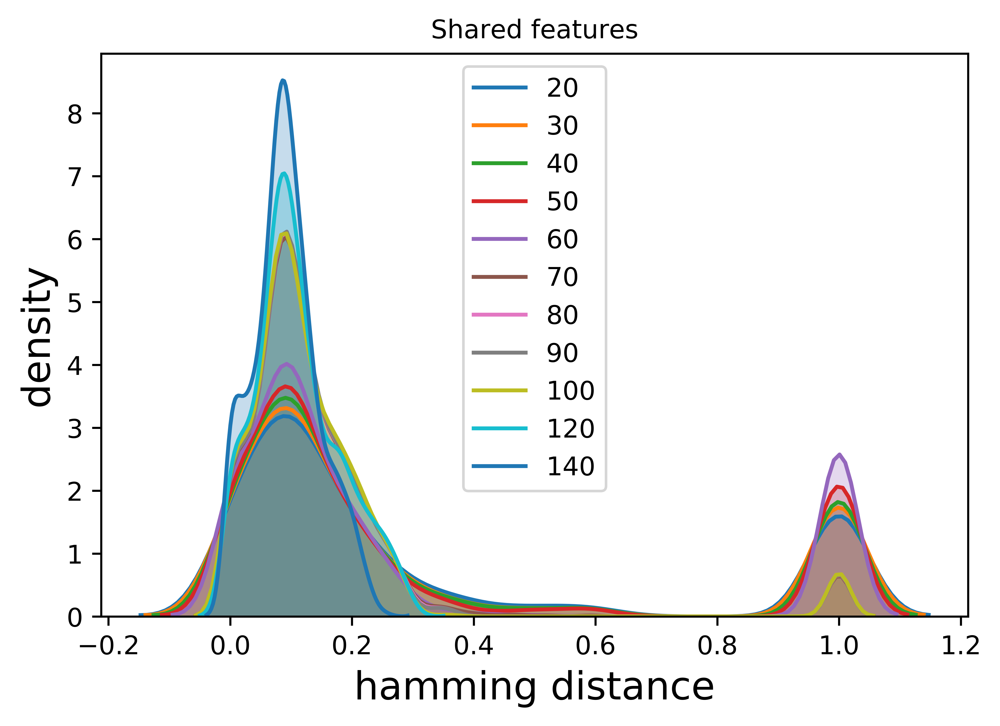

In [142]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(dpi=800)
for num in distribuciones.keys():
    sns.kdeplot(distribuciones[num],shade=True,label=str(num))

plt.title('Shared features',fontsize=10)
plt.ylabel(r'density',fontsize=15)
plt.xlabel(r'hamming distance',fontsize=15)
plt.savefig('sails/shared_features.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.rcParams.update({'font.size': 10})
plt.show()

### (4) Representación usando grafos

¿Cómo definimos grafos que representen las distancias entre lenguas? En este taller, nos centramos en **$k$-nearest graphs!**

In [149]:
import networkx as nx

def GRAPH_knn(num_rasgos,k):
    
    D = {lengua:{} for lengua in features_dict.keys()}
    for lengua in features_dict.keys():
        for lengualengua in features_dict.keys():
            n,H = hamming(lengua,lengualengua)
            if lengualengua in id_family.keys() and lengua in id_family.keys() and id_family[lengua] in F and id_family[lengualengua] in F and H!=-1:    
                if n>=num_rasgos:
                    D[lengua][lengualengua]=1-H
                    
    G=nx.Graph()
    for key in D.keys():
        D_ordered = list({k: v for k, v in sorted(D[key].items(), key=lambda item: item[1],reverse=True)}.items())[:k]
        D_ordered = [item[0] for item in D_ordered]
        for keykey in D_ordered:
            if G.has_edge(key,keykey)==False:
                G.add_edge(key,keykey,weight=D[key][keykey])
    
    return G

In [150]:
!pip install pydot

You should consider upgrading via the '/home/ec2-user/anaconda3/envs/python3/bin/python -m pip install --upgrade pip' command.


In [155]:
F = ['araw1281','maya1287','quec1387','pano1259','otom1299','tupi1275','nucl1710','cari1283','utoa1244']

import matplotlib.cm as cm

def plotG(num_rasgos,k):
    fig, ax = plt.subplots(dpi=800)
    G=GRAPH_knn(num_rasgos,k)
    
    print('número de nodos: '+str(len(G)))
    
    pos = nx.nx_pydot.graphviz_layout(G)#nx.kamada_kawai_layout(G)
    
    nodesA = [node for node in G.nodes() if id_family[node]=='araw1281']
    nodesM = [node for node in G.nodes() if id_family[node]=='maya1287']
    nodesQ = [node for node in G.nodes() if id_family[node]=='quec1387']
    nodesP = [node for node in G.nodes() if id_family[node]=='pano1259']
    nodesO = [node for node in G.nodes() if id_family[node]=='otom1299']
    nodesT = [node for node in G.nodes() if id_family[node]=='tupi1275']
    nodesN = [node for node in G.nodes() if id_family[node]=='nucl1710']
    nodesC = [node for node in G.nodes() if id_family[node]=='cari1283']
    nodesU = [node for node in G.nodes() if id_family[node]=='utoa1244']

    nodesnonA = [node for node in G.nodes() if id_family[node] not in ['araw1281','maya1287','quec1387','pano1259','otom1299','tupi1275','nucl1710','cari1283','utoa1244']]
    
    nx.draw_networkx_nodes(G, pos, nodelist=nodesA, node_size = 40, node_color='orange',node_shape='H',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1,label='araw1281') 
    nx.draw_networkx_nodes(G, pos, nodelist=nodesM, node_size = 40, node_color='m',node_shape='X', markeredgecolor='k',alpha=0.95,fillstyle='full',linewidths=0.1,label='maya1287') 
    nx.draw_networkx_nodes(G, pos, nodelist=nodesQ, node_size = 40, node_color='b',node_shape='o',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1,label='quec1387') 
    nx.draw_networkx_nodes(G, pos, nodelist=nodesP, node_size = 40, node_color='r',node_shape='s',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1,label='pano1259') 
    nx.draw_networkx_nodes(G, pos, nodelist=nodesO, node_size = 40, node_color='cyan',node_shape='D',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1,label='otom1299') 
    nx.draw_networkx_nodes(G, pos, nodelist=nodesT, node_size = 40, node_color='yellow',node_shape='*',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1,label='tupi1275') 
    nx.draw_networkx_nodes(G, pos, nodelist=nodesN, node_size = 40, node_color='green',node_shape='^',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1,label='nucl1710') 
    nx.draw_networkx_nodes(G, pos, nodelist=nodesC, node_size = 40, node_color='olive',node_shape='v',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1,label='cari1283') 
    nx.draw_networkx_nodes(G, pos, nodelist=nodesU, node_size = 40, node_color='lime',node_shape='p',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1,label='utoa1244') 
    #nx.draw_networkx_nodes(G, pos, nodelist=nodesnonA, node_size = 10, node_color='k',alpha=0.25,fillstyle='none',linewidths=0.1,label='Other') 
    nx.draw_networkx_edges(G, pos, alpha=0.5,width=0.25,edge_color='k')
    plt.title(str(num_rasgos)+' features '+'and '+str(len(G))+' languages',fontsize=10)
    plt.legend(loc='best',fontsize=5)
    plt.axis('off')
    plt.savefig('sails/graph_knn_'+str(num_rasgos)+'.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=1080)
    plt.show()

número de rasgos 20
número de nodos: 86


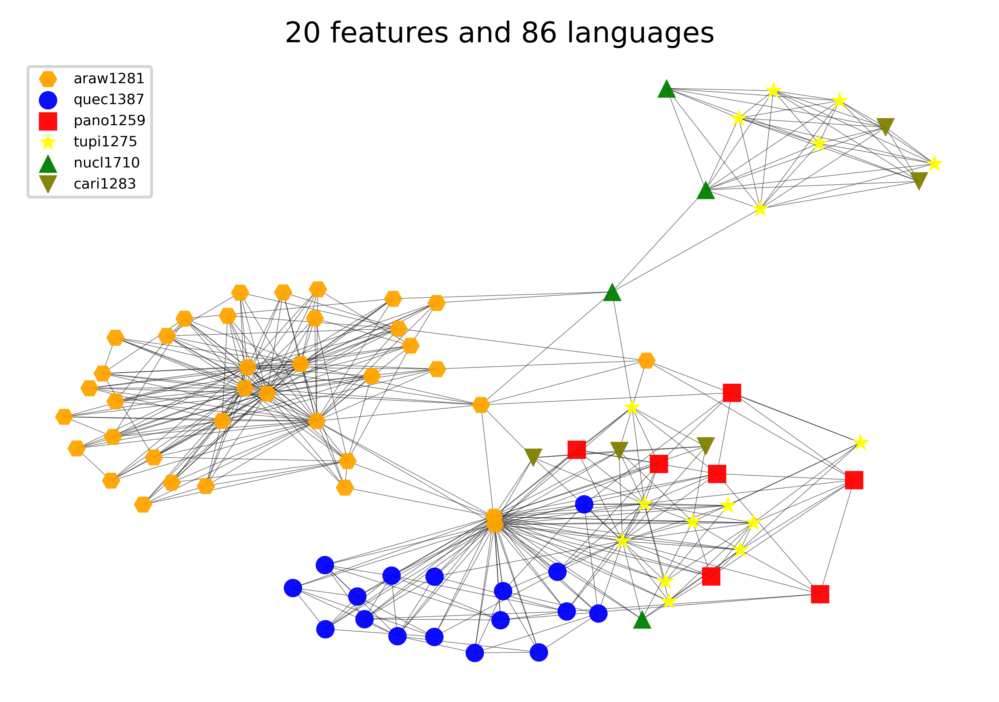

número de rasgos 30
número de nodos: 84


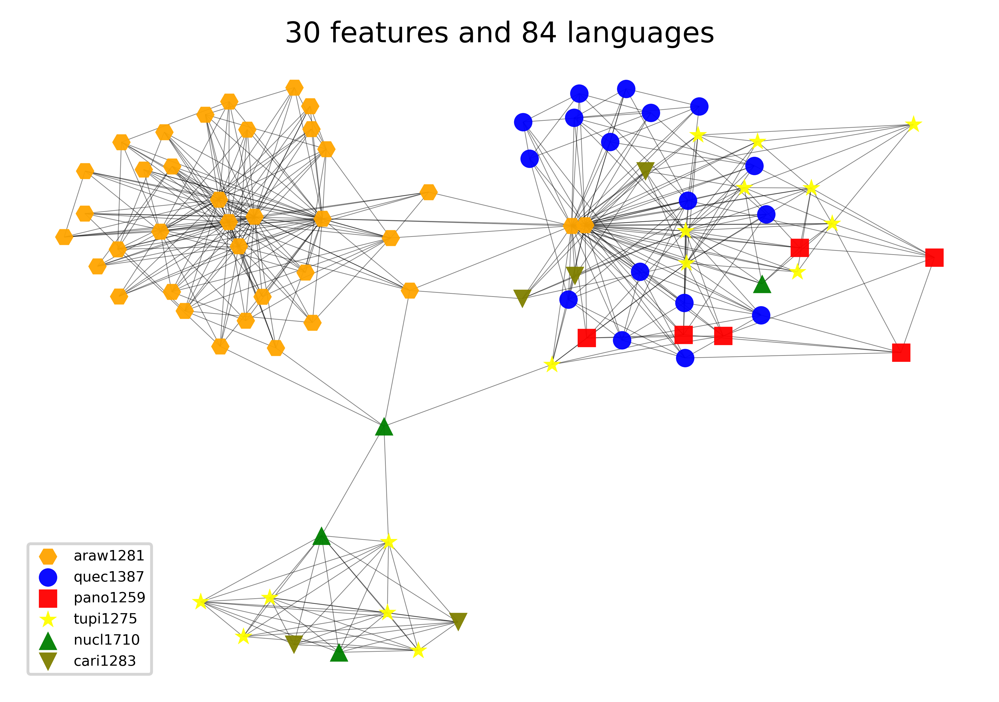

número de rasgos 40
número de nodos: 83


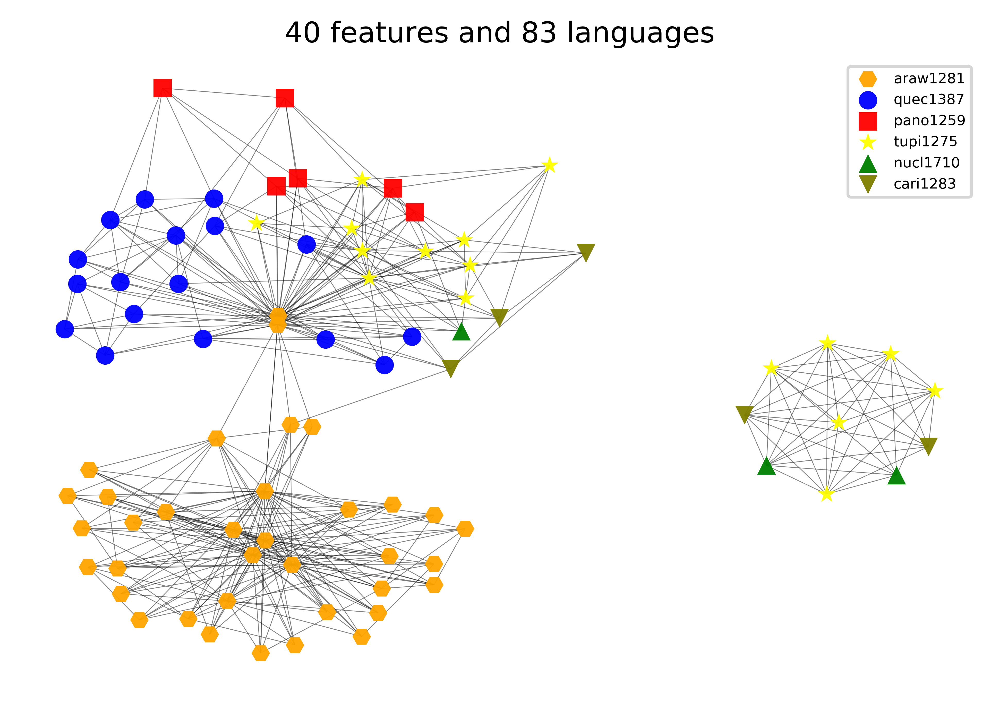

número de rasgos 50
número de nodos: 83


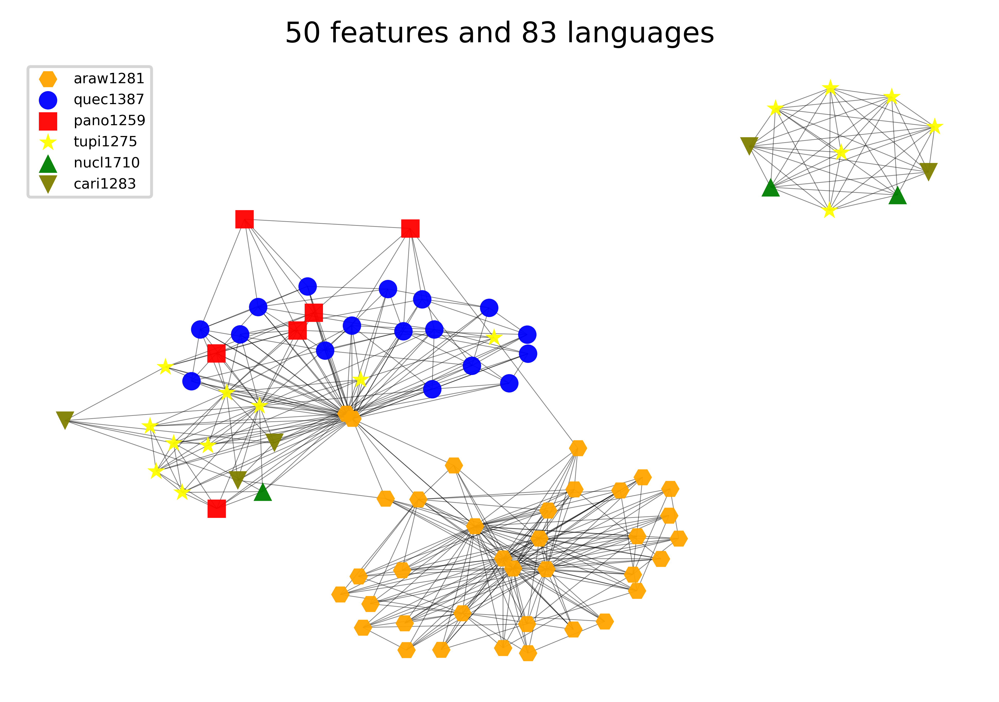

número de rasgos 60
número de nodos: 82


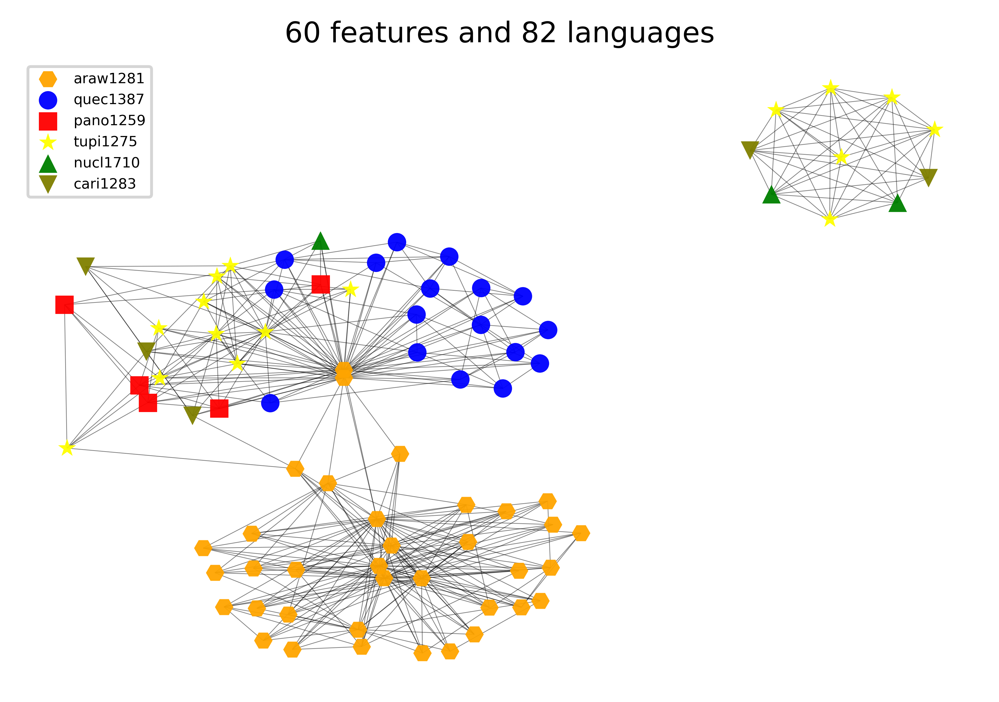

número de rasgos 70
número de nodos: 74


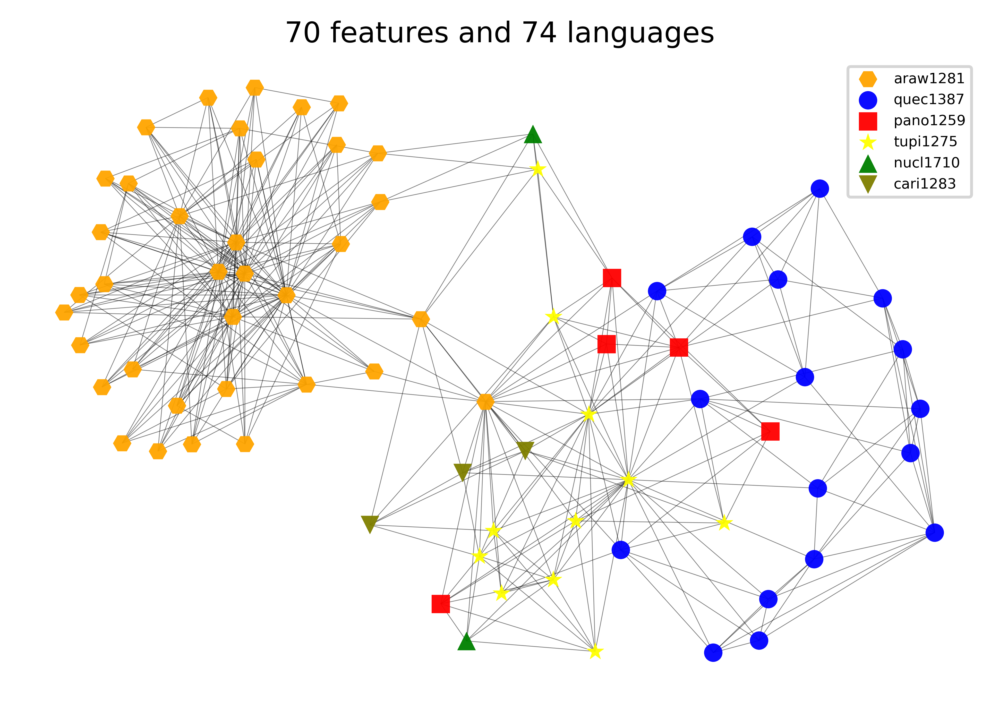

número de rasgos 80
número de nodos: 74


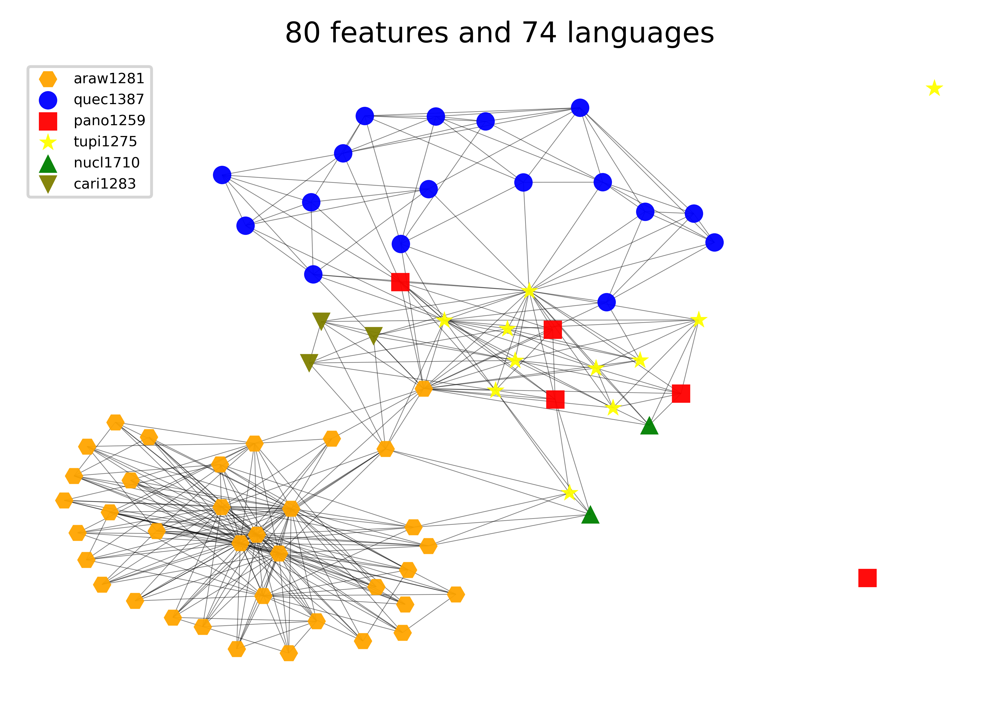

número de rasgos 90
número de nodos: 72


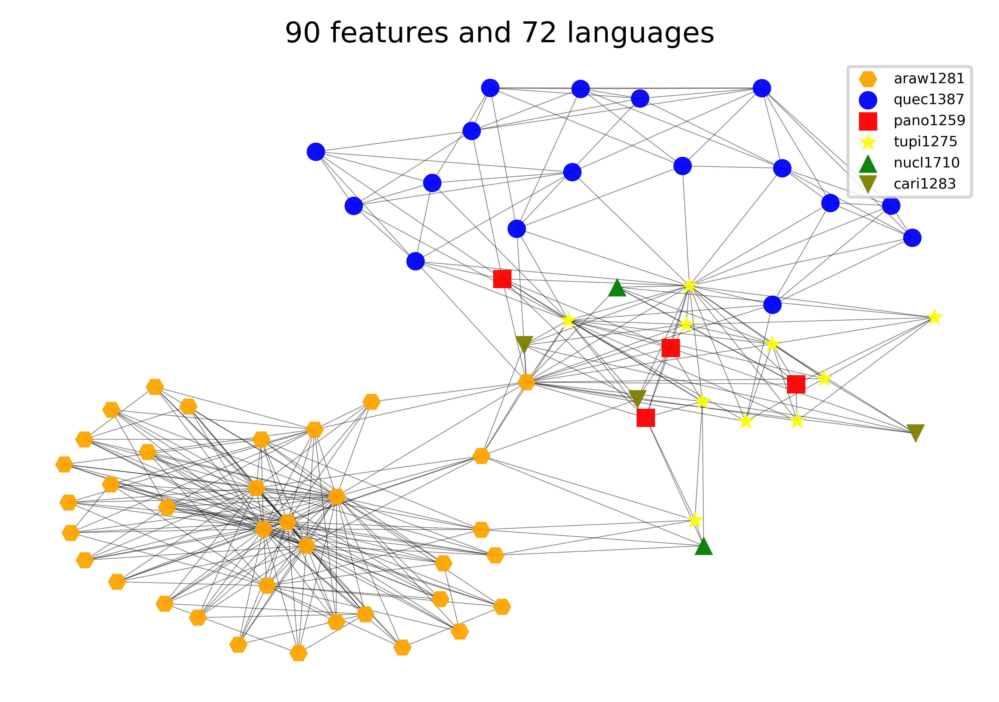

número de rasgos 100
número de nodos: 72


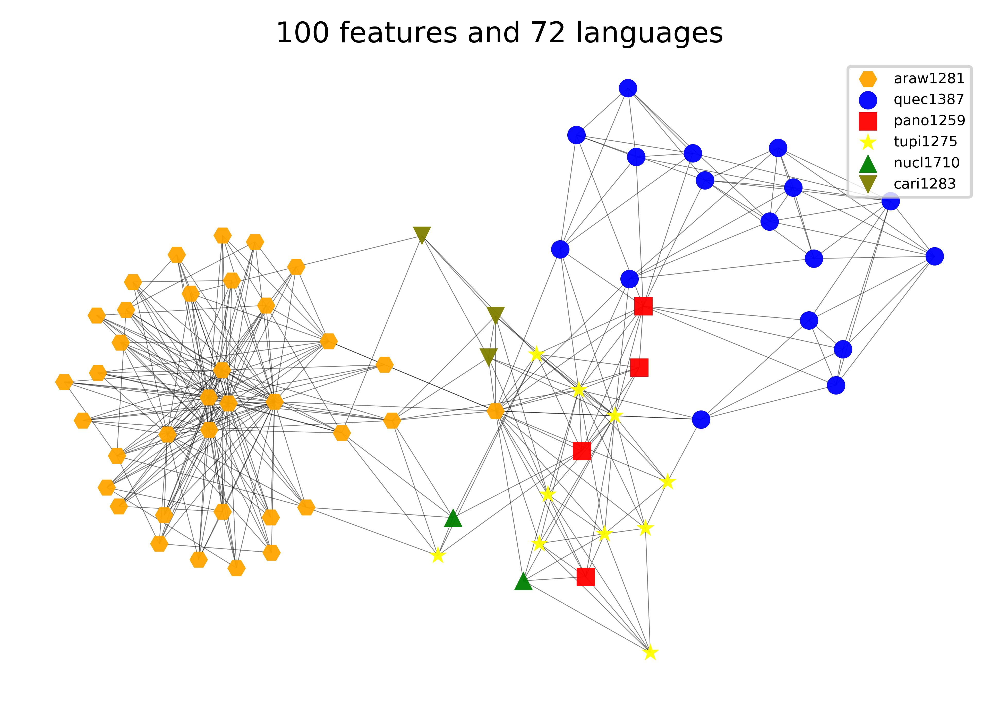

número de rasgos 120
número de nodos: 68


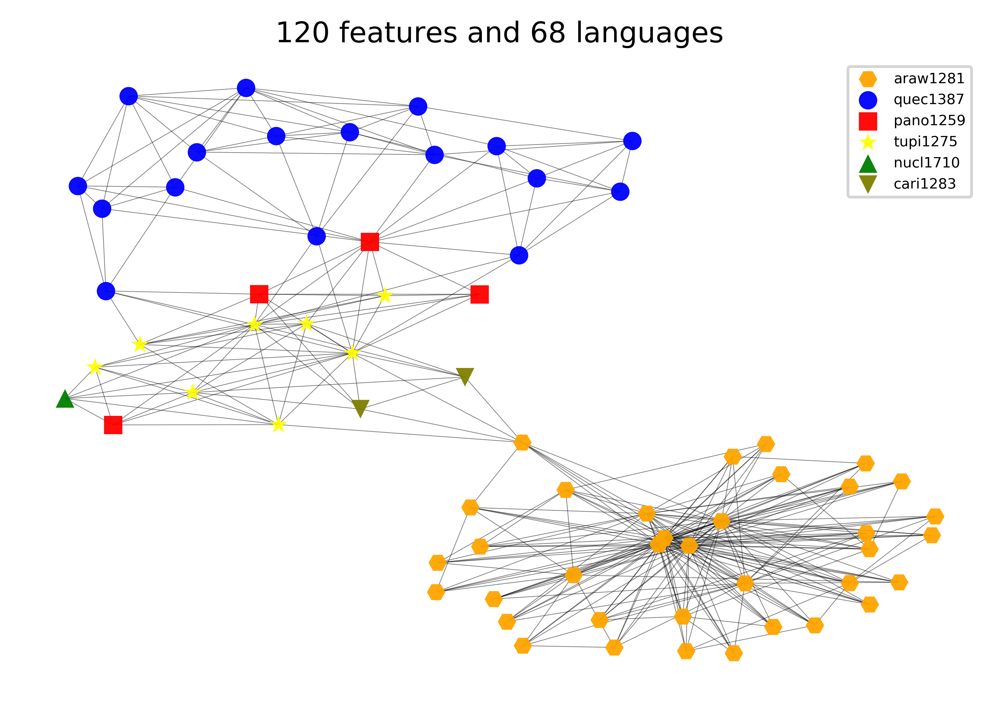

número de rasgos 140
número de nodos: 66


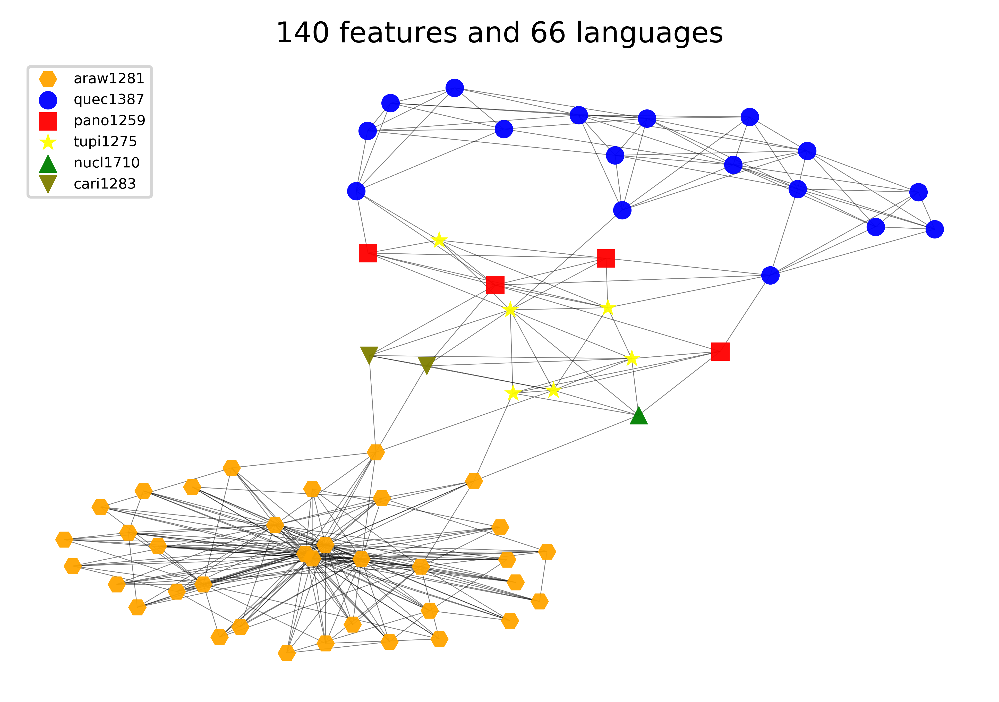

In [156]:
## mostramos la red de lenguas 

for num in distribuciones.keys():
    print('número de rasgos '+str(num))
    plotG(num,7)

## Medidas de centralidad!

Mediante diversas medidas de centralidad, describimos las relaciones que se establecen en las lenguas. 

In [158]:
## elegimos un umbral de número de rasgos

G=GRAPH_knn(30,7)